In [2]:
%matplotlib inline
import sys
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import scipy as sp
import plotly.graph_objects as go

# Data reading
import pandas as pd
import csv
import pickle

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# networkx

import networkx as nx
from networkx.algorithms import community
from networkx.algorithms.community import greedy_modularity_communities
from networkx.algorithms.community import k_clique_communities

from community import community_louvain

import scipy.sparse.linalg
import jgraph as ig

In [3]:
# Read networks from file
#G_CDC28=nx.read_weighted_edgelist("./../Data/4932_protein_links_v11_0.txt",comments="#",nodetype=str)
G_CDC28=nx.read_weighted_edgelist("4932.protein.links.v11.0.txt",comments="#",nodetype=str)

In [4]:
# Choose the network to be analyzed below
G0=G_CDC28
# delete those edges with a combined score of <= thershold_score (small confidence)
threshold_score = 700
#threshold_score = 0
for edge in G0.edges: 
    G0.get_edge_data(edge[0],edge[1])
    weight = list(G0.get_edge_data(edge[0],edge[1]).values())
    #print('qwe',weight[0])
    if(weight[0] <= threshold_score):
        G0.remove_edge(edge[0],edge[1])
# restrict to largest connected component
largest_cc = max(nx.connected_components(G0),key=len)
G0=G0.subgraph(largest_cc).copy()

In [5]:
partLouvain = community_louvain.best_partition(G0,resolution=0.5,random_state=1)
number_of_communities = max(list(partLouvain.values()))+1
print('# of partitions for Louvain modularity =',number_of_communities)

# of partitions for Louvain modularity = 29


In [6]:
# define the communities as separate graphs

#subgraph dict with community number as key and subgraph as value
G_cluster = {}

#node dict with community number as key and node as value
nodes = {}
for i in range(number_of_communities):
    nodes[i] = []

for name, community in partLouvain.items():
    nodes[community].append(name)
    
for key in nodes.keys():
    G_cluster[key] = G0.subgraph(nodes[key])

In [214]:
top10_final = []
for i in range(number_of_communities):
    G = G_cluster[i]
    measuresNames=["Degree"]
    if len(G.nodes)>2:
        listMeasures = [dict(nx.degree(G))]
   
    if len(G.nodes)<=2:
        listMeasures = [dict(nx.degree(G))]
   
    for idx,dictMeasure in enumerate(listMeasures):
        top10 = [[dictMeasure[k],k] for k in dictMeasure.keys()] # Choose the 10 largest values
        top10.sort(reverse=True)
        top10_final.append([x[1] for x in top10[:10]])

In [215]:
flat_list = [item for sublist in top10_final for item in sublist]
G2 = G0.copy()
G2 = G2.subgraph(flat_list)

In [216]:
pos = nx.random_layout(G2)
# find node near center (0.5,0.5)
edge_x = []
edge_y = []
for edge in G2.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G2.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [217]:
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G2.adjacency()):
    node_adjacencies.append(G0.degree[adjacencies[0]])
    node_text.append(adjacencies[0]+': # of connections: '+str(G0.degree[adjacencies[0]]))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Top 10 nodes by degree from each commmnities [degree measured in the original graph]',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.write_html("/home/yuanda/Desktop/Top10_org.html")

In [218]:
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G2.adjacency()):
    node_adjacencies.append(G2.degree[adjacencies[0]])
    node_text.append(adjacencies[0]+': # of connections: '+str(G2.degree[adjacencies[0]]))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Top 10 nodes by degree from each commmnities [degree measured within communities]',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)),
                )
fig.write_html("/home/yuanda/Desktop/Top10_within.html")

In [219]:
def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

def test():
    # to install networkx 2.0 compatible version of python-louvain use:
    # pip install -U git+https://github.com/taynaud/python-louvain.git@networkx2
    from community import community_louvain

    g = nx.karate_club_graph()
    partition = community_louvain.best_partition(G0,resolution=0.5,random_state=1)
    pos = community_layout(G0, partition)

    nx.draw(G0, pos, node_color=list(partition.values()),node_size=30,seed = 3); 
    plt.savefig("/home/yuanda/Desktop/community_structure.png",dpi=300, bbox_inches='tight')
    return

# Community Structure 

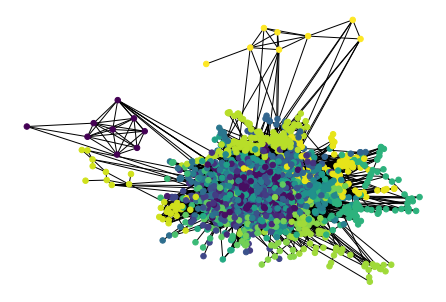

In [220]:
test()

In [53]:
def plot_loghist(x,measure,number):
  plt.clf()
  hist, bins = np.histogram(x)
  logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
  plt.hist(x)
#   plt.hist(x)
#   plt.xscale('log')
  plt.xlabel(measure+' centrality')
#   plt.yscale('log')
  plt.title("Community "+str(number))
  plt.ylabel('Number of vertices having ' +measure+ ' centrality k in the community')
  plt.savefig("/home/yuanda/Desktop/"+measure+'/community'+str(number)+'.jpg',dpi=300, bbox_inches='tight')

In [42]:
top10_final = {}
for i in range(number_of_communities):
    top10_final[i] = []
    G = G_cluster[i]
    measuresNames=["Degree","Eigenvector","Page Rank"]
    if len(G.nodes)>2:
        listMeasures = [dict(nx.degree(G)),nx.eigenvector_centrality_numpy(G),nx.pagerank(G)]
   
    if len(G.nodes)<=2:
        listMeasures = [dict(nx.degree(G)),nx.eigenvector_centrality(G),nx.pagerank(G)]
   
    for idx,dictMeasure in enumerate(listMeasures):
        top10 = [[dictMeasure[k],k] for k in dictMeasure.keys()] # Choose the 10 largest values
        top10.sort(reverse=True)
        top10_final[i].append(top10)


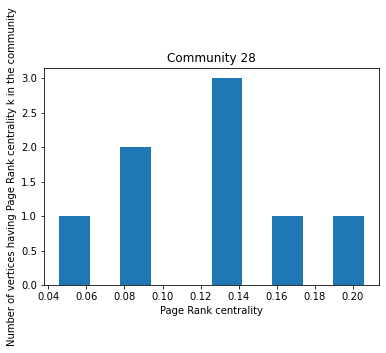

In [54]:
for number,comm in top10_final.items():
    for idx, measure in enumerate(comm):
        l = [x[0] for x in measure]
        plot_loghist(l,measuresNames[idx],number)